> Workshop LabCity
# Processamento de Imagens com Python e OpenCV
## Parte 1: Introdução ao OpenCV

Nesta aula iremos aprender as funções básicas de carregamento de imagens com OpenCV.

- Representação matricial de imagens
- Leitura, exibição e armazenamento de imagens
- Trabalhando com arquivos de vídeo
- Trabalhando com feed de uma câmera externa

Utilizaremos a imagem `workshop-opencv/notebooks/images/gatogordo.jpg` para demonstração.

---
## Importando as bibliotecas necessárias

In [1]:
import cv2  # Importa o OpenCV
import numpy as np  # Importa o NumPy como np
import matplotlib.pyplot as plt  # Importa o matplotlib como plt

---
## Carregando a imagem com OpenCV

In [2]:
example_image = "media/gatogordo.jpg"  # Define o caminho da imagem de exemplo

# Carregar a imagem em escala de cinza e armazenar em uma variável
imagem = cv2.imread(example_image, 0)

In [3]:
# Verificar o conteúdo da matriz
imagem

array([[107, 108, 109, ...,  59,  60,  60],
       [107, 108, 108, ...,  60,  61,  61],
       [106, 107, 107, ...,  61,  61,  61],
       ...,
       [ 46,  47,  47, ...,  49,  50,  50],
       [ 46,  46,  47, ...,  48,  49,  49],
       [ 48,  48,  48, ...,  45,  44,  44]], dtype=uint8)

In [4]:
# Verificar o formato da matriz
imagem.shape

(1250, 1250)

In [5]:
# os Valores da imagem variam de 0 a 255
imagem.min(), imagem.max()

(0, 246)

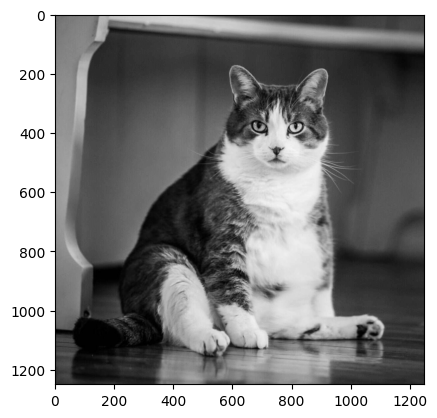

In [6]:
# Exibir a imagem com matplotlib
# É possível aplicar mapas de cores com o parâmetro cmap
plt.imshow(imagem, cmap="gray")

In [7]:
# Carregar a imagem RGB e armazenar em uma variável
imagem = cv2.imread(example_image, 1)

In [8]:
# Verificar o formato da matriz
imagem.shape

(1250, 1250, 3)

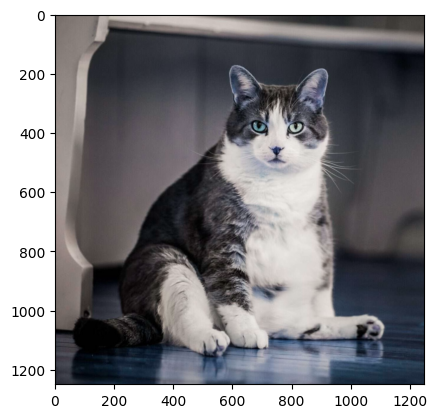

In [9]:
# Exibir a imagem com matlpotlib
plt.imshow(imagem)

> No OpenCV, a ordem das cores é BGR (azul, verde, vermelho), enquanto no Matplotlib a ordem é RGB (vermelho, verde, azul). Portanto, ao exibir imagens carregadas com OpenCV usando Matplotlib, é comum precisar converter a ordem das cores de BGR para RGB.

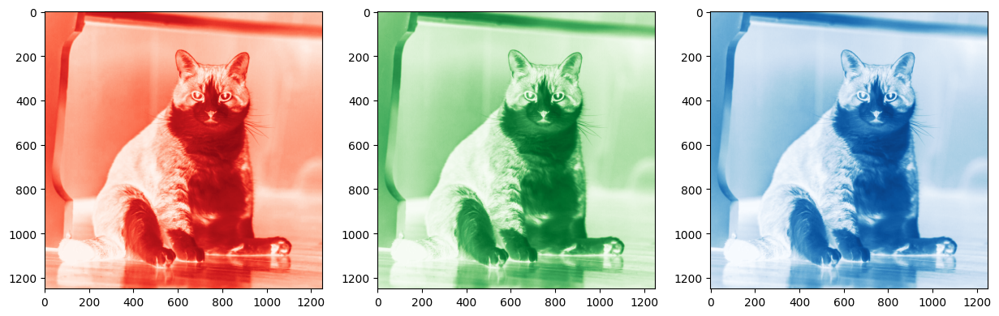

In [10]:
# Podemos separar os canais de imagem manualmente e concatená-los
BLUE = imagem[:, :, 0]
GREEN = imagem[:, :, 1]
RED = imagem[:, :, 2]

# Mostrar as características de cada canal
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(RED, cmap="Reds")
plt.subplot(1, 3, 2)
plt.imshow(GREEN, cmap="Greens")
plt.subplot(1, 3, 3)
plt.imshow(GREEN, cmap="Blues")

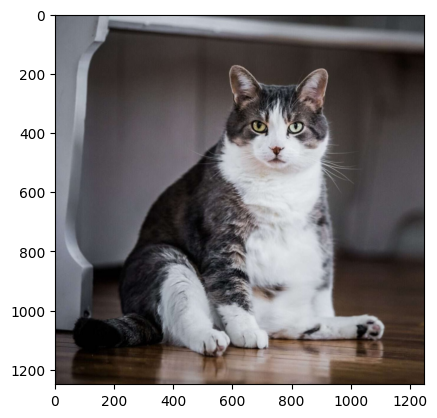

In [11]:
# Montar uma imagem RGB a partir dos canais separados
imagem_rgb = np.stack([RED, GREEN, BLUE], axis=2)
plt.imshow(imagem_rgb)

In [12]:
# Salvando a imagem em disco
cv2.imwrite("media/gatogordo_rgb.jpg", imagem_rgb)

True

---
## Trabalhando com arquivos de video

Um arquivo de vídeo consiste em uma sequência de imagens. A função VideoCapture é capaz de ler e iterar sobre um frame de cada vez. Portanto, todas as funcionalidades utilizadas a imagens podem ser aplicáveis em frames de vídeo.


In [13]:
video = "media/gatoburro.mp4"

# A função cv2.VideoCapture() é capaz de ler os frames de um vídeo
capture = cv2.VideoCapture(video)

In [14]:
# Verificar o FPS do video
capture.get(cv2.CAP_PROP_FPS)

15.0

In [15]:
# Verificar o formato do vídeo
capture.get(cv2.CAP_PROP_FRAME_WIDTH), capture.get(cv2.CAP_PROP_FRAME_HEIGHT)

(630.0, 776.0)

In [16]:
# Verificar o número de frames do vídeo
capture.get(cv2.CAP_PROP_FRAME_COUNT)

76.0

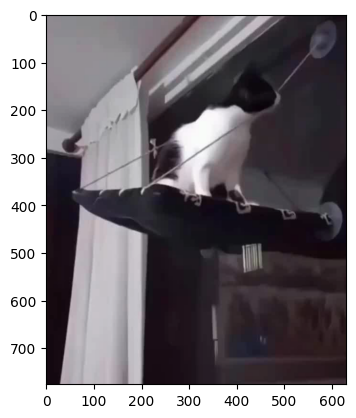

In [17]:
ret, frame = capture.read()
rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
plt.imshow(rgb_frame)

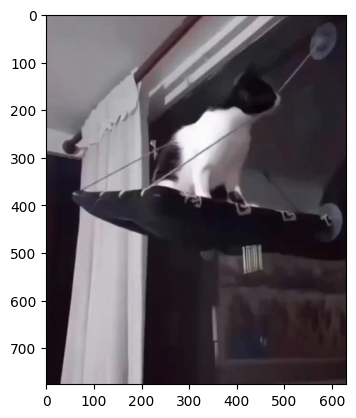

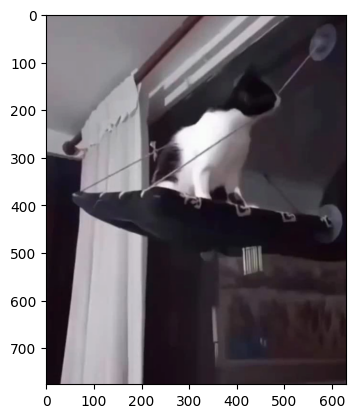

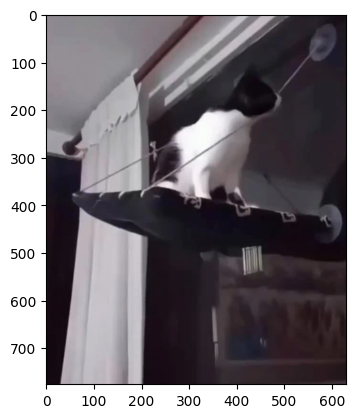

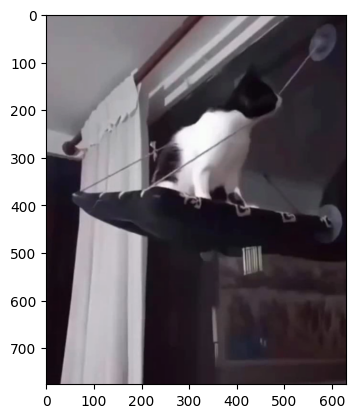

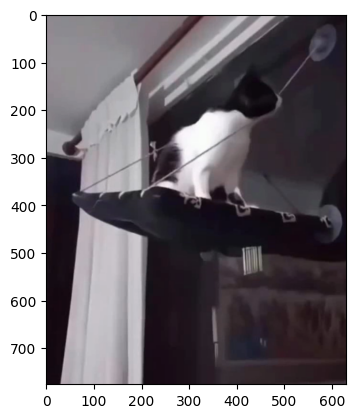

...

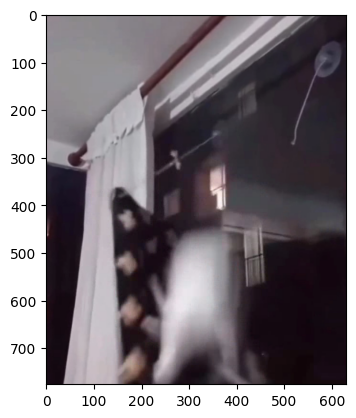

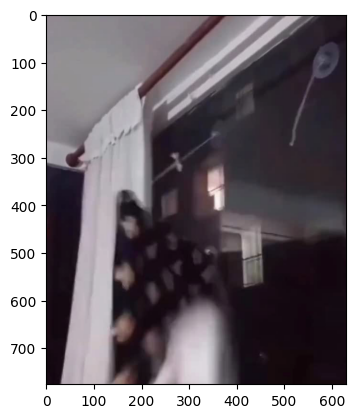

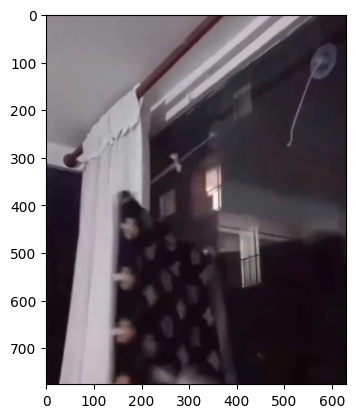

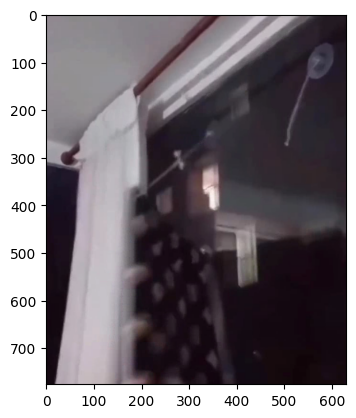

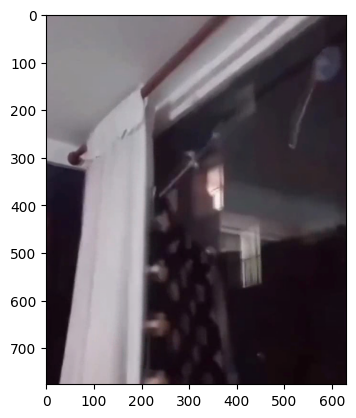

In [18]:
import time

while capture.isOpened():
    ret, frame = capture.read()
    if not ret:
        break
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(rgb_frame)
    plt.show()
    time.sleep(1 / 30)